In [1]:
import pandas as pd
import numpy as np
from keras.preprocessing import image
from keras_applications import imagenet_utils
#see doc for built-in functions https://github.com/keras-team/keras-applications/blob/master/keras_applications/imagenet_utils.py#L157
from keras.applications.vgg16 import VGG16, preprocess_input

from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.layers.convolutional import Conv2D, MaxPooling2D, ZeroPadding2D

import os
import time
import sys

from sklearn.metrics.pairwise import cosine_similarity

Using TensorFlow backend.


In [2]:
#read_csv: Read a comma-separated values (csv) file into DataFrame.
#need to change this for aws code
bbc_ft = pd.read_csv('/Users/xinrucheng/Documents/Metis_bootcamp/week_9/metis_passion_project/data/processed/Features.csv')
bbc_ft[:5]

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,4086,4087,4088,4089,4090,4091,4092,4093,4094,4095
0,0,0.000000,3.509541,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.0,0.000000,1.018812,0.000000,2.679488,0.000000
1,1,0.017876,2.738089,0.000000,0.000000,2.499179,0.000000,0.000000,0.000000,1.768674,...,0.525963,0.000000,0.0,0.0,0.0,3.004055,0.000000,0.000000,4.274214,0.000000
2,2,0.000000,0.000000,0.000000,1.795153,0.000000,1.155841,0.043871,2.865308,0.000000,...,0.000000,0.000000,0.0,0.0,0.0,0.232908,0.000000,1.179471,0.549198,0.000000
3,3,0.000000,0.468124,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.055124,0.0,0.0,0.0,2.004137,0.000000,0.000000,4.093263,0.000000
4,4,0.000000,0.000000,2.590657,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.0,0.0,0.0,0.000000,3.397941,1.178361,0.598724,2.223511


In [3]:
type(bbc_ft.iloc[0].values) #df Series.values are arrays!

numpy.ndarray

In [4]:
def cos_sim_vs_all(imageft, datasetft):
    '''Find the pairwise cosine similarity between features of the chosen image and all the images in the dataset'''
    sim_list = []
    for i in range(len(datasetft)):
        cos_sim = cosine_similarity(imageft, datasetft.iloc[i].values.reshape(1,-1)) 
        sim_list.append(cos_sim)
    return np.array(sim_list)

In [5]:
cos_sim_vs_all(bbc_ft.iloc[0].values.reshape(1, -1), bbc_ft)  #use iloc for df indices!
#most similar with itself, makes sense

#but sorting in descending again?

array([[[1.        ]],

       [[0.47906447]],

       [[0.24277938]],

       ...,

       [[0.00600695]],

       [[0.01585503]],

       [[0.02155306]]])

In [6]:
!pwd

/Users/xinrucheng/Documents/Metis_bootcamp/week_9/metis_passion_project


In [7]:
#from feature extractor-Copy1 notebook, changed directory because cos_sim is saved under metis_passion_project
#easier if move to aws? have unzipped data there
bbc_list = !ls /Users/xinrucheng/Documents/Metis_bootcamp/week_9/project5data/2017_140k/recipe_photos/bbc_photos/pages-photos

In [8]:
len(bbc_list)

2225

In [9]:
bbc_list[:20]

['15_minute_pasta_33407_16x9.jpg',
 '2_hour_christmas_dinner_79341_16x9.jpg',
 '3d_biscuits_29555_16x9.jpg',
 '_chicken_chasseur_with_19163_16x9.jpg',
 '_schichttorte_49934_16x9.jpg',
 'aclassicspongecakewi_9406_16x9.jpg',
 'albanian_baked_lamb_with_92485_16x9.jpg',
 'all-day_breakfast_12416_16x9.jpg',
 'all-in-one_rib_roast_75464_16x9.jpg',
 'all-purpose_easy_butter_03274_16x9.jpg',
 'almond_and_lemon_polenta_21317_16x9.jpg',
 'almond_rice_pudding_and_42007_16x9.jpg',
 'almond_tart_40368_16x9.jpg',
 'almondrolledgoatsche_86765_16x9.jpg',
 'almondymincepies_14566_16x9.jpg',
 'alpine_pizza_32132_16x9.jpg',
 'amarettibistcuits_67183_16x9.jpg',
 'americanbakedcheesec_8358_16x9.jpg',
 'americanbuttermilkpa_74762_16x9.jpg',
 'americanchocolaterip_6334_16x9.jpg']

> list.index(x)
Return the index in the list of the first item whose value is x. It is an error if there is no such item.

### Roast turkey
(Nov 29, submitted as mvp)

In [10]:
bbc_list.index('perfect_roast_turkey_72482_16x9.jpg') #find index of roast turkey image

1412

In [11]:
turkey_sim = cos_sim_vs_all(bbc_ft.iloc[1412].values.reshape(1, -1), bbc_ft) 

In [12]:
sim_srt = turkey_sim.argsort(axis=None)

In [13]:
#np.fliplr(sim_srt)  #Requires the array to be at least 2-D

turkey_sorted = np.flipud(sim_srt) #flipud(up-down) doesn't require 2-D arrays
turkey_sorted[:10]

array([1412, 2064, 2127, 2221, 2201, 1620, 2006, 1792, 2067, 1633])

In [14]:
bbc_list[1412] #recipe itself, sim = 1

'perfect_roast_turkey_72482_16x9.jpg'

In [15]:
bbc_list[2064]  #automate this? loop

'the_perfect_roast_turkey_01155_16x9.jpg'

In [16]:
def print_similar(sorted_array):
    for idx in sorted_array:
        print(bbc_list[idx])
        
print_similar(turkey_sorted[:25])

perfect_roast_turkey_72482_16x9.jpg
the_perfect_roast_turkey_01155_16x9.jpg
turkey_crown_with_orange_47645_16x9.jpg
yorkshirepuddings_86010_16x9.jpg
whole_roasted_masala_77631_16x9.jpg
roast_goose_with_apples_74479_16x9.jpg
sun-dried_tomato_and_97049_16x9.jpg
slow_cooker_beef_brisket_98634_16x9.jpg
theperfectbakedpotat_67837_16x9.jpg
roastbellyofporkwith_73882_16x9.jpg
stuffedchickenbreast_72067_16x9.jpg
scones_with_jam_and_10035_16x9.jpg
wholetandoorichicken_74790_16x9.jpg
veggie_bean_burgers_for_53280_16x9.jpg
welsh_cakes_16706_16x9.jpg
spiced_beef_empanadas_36922_16x9.jpg
thai_roast_chicken_92130_16x9.jpg
stressfreefullenglis_67721_16x9.jpg
southernfriedchicken_83647_16x9.jpg
roastchickenandsagea_92462_16x9.jpg
spinach_and_cheese_45199_16x9.jpg
tortapasquale_88435_16x9.jpg
veggie_crumble_28446_16x9.jpg
turkey_curry_45626_16x9.jpg
strawberryjam_90294_16x9.jpg


Most similar images using cosine similarity as metris has some roast turkey/chicken/goose, but also other stuff

In [17]:
print_similar(turkey_sorted[-10:]) 

all-purpose_easy_butter_03274_16x9.jpg
all-in-one_rib_roast_75464_16x9.jpg
all-day_breakfast_12416_16x9.jpg
albanian_baked_lamb_with_92485_16x9.jpg
aclassicspongecakewi_9406_16x9.jpg
_schichttorte_49934_16x9.jpg
_chicken_chasseur_with_19163_16x9.jpg
3d_biscuits_29555_16x9.jpg
2_hour_christmas_dinner_79341_16x9.jpg
15_minute_pasta_33407_16x9.jpg


Unfortunately one of the images with the lowest similarity score ('2_hour_christmas_dinner_79341_16x9.jpg') does have a roast turkey (top view, covered in bacon, looks quite different)

In [18]:
#bbc_path = 'project5data/2017_140k/recipe_photos/bbc_photos/pages-photos/'  #file path error? but the image is there--needed to use absolute path
bbc_path='/Users/xinrucheng/Documents/Metis_bootcamp/week_9/project5data/2017_140k/recipe_photos/bbc_photos/pages-photos/'

In [19]:
#display images in loop?
def print_similar_imgs(sorted_array, num, path):        
    for idx in sorted_array[:num]:
        print(bbc_list[idx])
        %pylab inline
        import matplotlib.pyplot as plt
        import matplotlib.image as mpimg
        img=mpimg.imread(path + bbc_list[idx])
        imgplot = plt.imshow(img)
        plt.show()

perfect_roast_turkey_72482_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


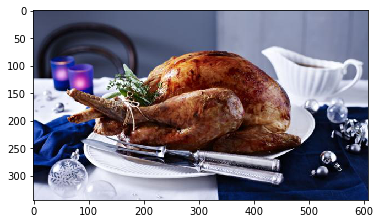

the_perfect_roast_turkey_01155_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


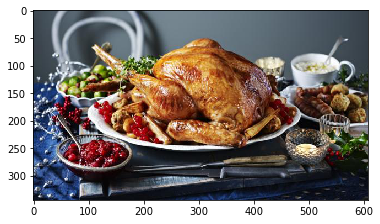

turkey_crown_with_orange_47645_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


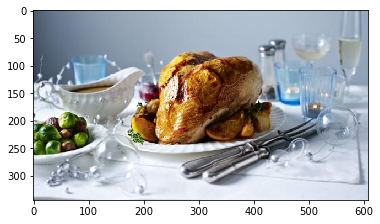

yorkshirepuddings_86010_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


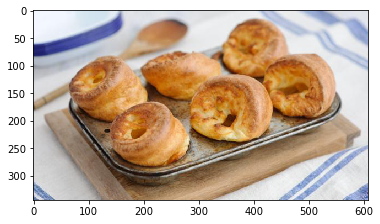

whole_roasted_masala_77631_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


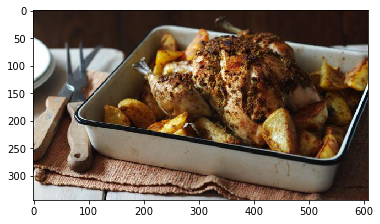

roast_goose_with_apples_74479_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


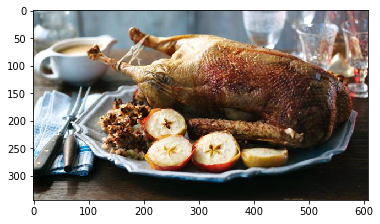

sun-dried_tomato_and_97049_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


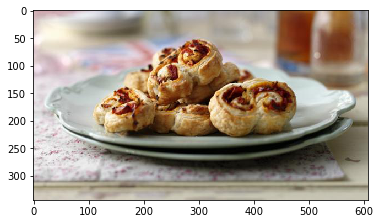

slow_cooker_beef_brisket_98634_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


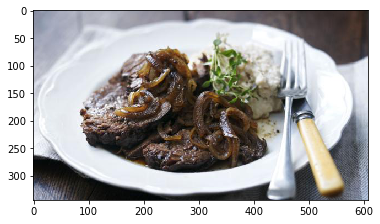

theperfectbakedpotat_67837_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


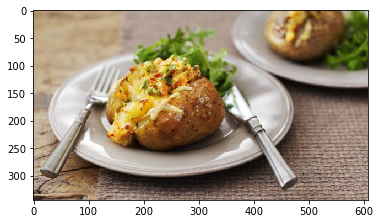

roastbellyofporkwith_73882_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


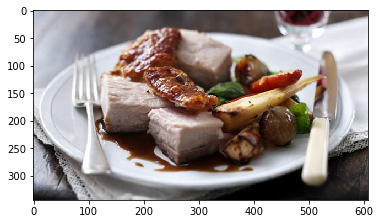

stuffedchickenbreast_72067_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


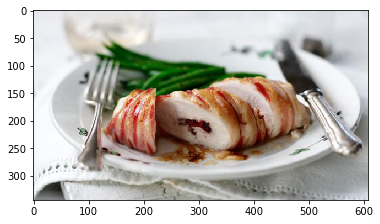

scones_with_jam_and_10035_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


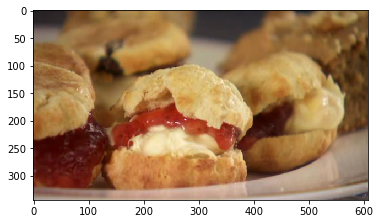

wholetandoorichicken_74790_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


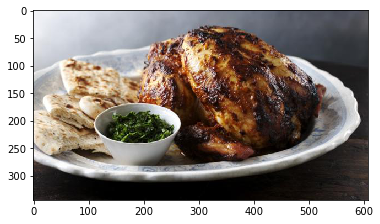

veggie_bean_burgers_for_53280_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


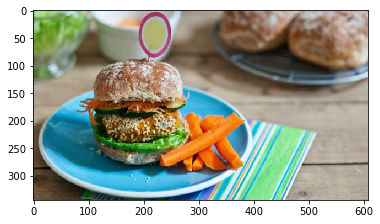

welsh_cakes_16706_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


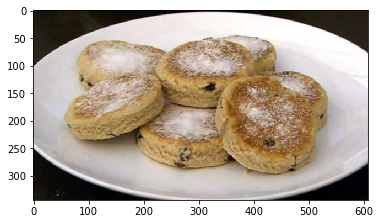

spiced_beef_empanadas_36922_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


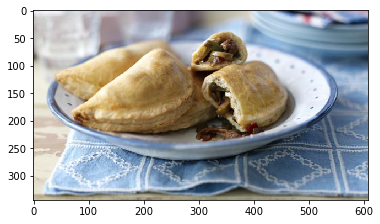

thai_roast_chicken_92130_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


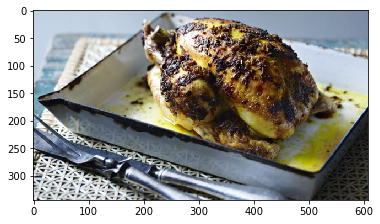

stressfreefullenglis_67721_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


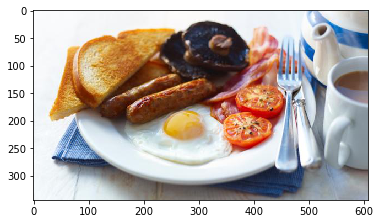

southernfriedchicken_83647_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


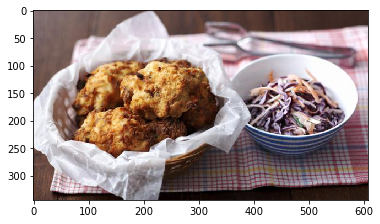

roastchickenandsagea_92462_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


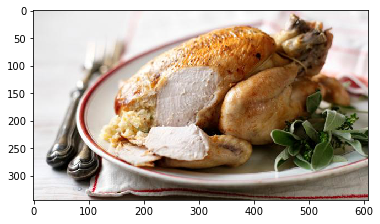

In [20]:
print_similar_imgs(turkey_sorted,20,path = bbc_path) 

After top 5, start to look very different. How high are the cosine similarities? argsort only gives order of indicies, not their values (make array?)

In [21]:
#turkey_sim = cos_sim_vs_all(bbc_ft.iloc[1412].values.reshape(1, -1), bbc_ft) 
turkey_sim[-20:]

array([[[0.9987505 ]],

       [[0.99865531]],

       [[0.99890285]],

       [[0.99881383]],

       [[0.99861272]],

       [[0.99869471]],

       [[0.99865551]],

       [[0.99873078]],

       [[0.99869279]],

       [[0.99847378]],

       [[0.99852622]],

       [[0.99856972]],

       [[0.99867696]],

       [[0.99833486]],

       [[0.99869978]],

       [[0.99879493]],

       [[0.99902689]],

       [[0.99850724]],

       [[0.99861405]],

       [[0.99804727]]])

In [22]:
turkey_sorted[:21] #index of image itself and top 20 most similar images

array([1412, 2064, 2127, 2221, 2201, 1620, 2006, 1792, 2067, 1633, 1995,
       1743, 2207, 2161, 2185, 1879, 2054, 1988, 1853, 1636, 1922])

Example from numpy:
```
x = np.array([[0, 3], [2, 2]])

>>> ind = np.argsort(x, axis=1)  # sorts along last axis (across)
>>> ind
array([[0, 1],
       [0, 1]])
>>> np.take_along_axis(x, ind, axis=1)  # same as np.sort(x, axis=1)
array([[0, 3],
       [2, 2]])



>>> ind = np.argsort(x, axis=0)  # sorts along first axis (down)
>>> ind
array([[0, 1],
       [1, 0]])
>>> np.take_along_axis(x, ind, axis=0)  # same as np.sort(x, axis=0)
array([[0, 2],
       [2, 3]])
      ```

```
>>> np.flipud([1,2])
array([2, 1])
```
> Flip array in the up/down direction. Does not require array to be 2-D

### Chocolate cake
some chocolate cake recipes only have 'chocolate' in title, not 'cake' (image title length limit?)

In [23]:
bbc_list.index('easy_chocolate_cake_31070_16x9.jpg') #find index of basic chocolate cake image

697

In [24]:
choco_sim = cos_sim_vs_all(bbc_ft.iloc[697].values.reshape(1, -1), bbc_ft) 

In [25]:
csim_srt = choco_sim.argsort(axis=None)
csim_srt

array([   0,    1,    2, ..., 1662, 1588,  697])

In [26]:
choco_sorted = np.flipud(csim_srt) #flipud(up-down) doesn't require 2-D arrays
choco_sorted[:21] #top 20 most similar, including easy_chocolate_cake itself (index 697)

array([ 697, 1588, 1662, 1190, 1772, 1545, 2117, 2107, 2100, 1717, 1253,
       1232, 1526, 1843, 1568, 1710, 1721, 1592, 1956, 2002, 2065])

In [27]:
def print_similar(sorted_array):
    for idx in sorted_array:
        print(bbc_list[idx])
        
print_similar(choco_sorted[:21]) #doesn't look great, there are a few chocolate cakes I expected to show up that are not here
#but at least there are a few cakes

easy_chocolate_cake_31070_16x9.jpg
red_velvet_cake_70743_16x9.jpg
roastlegoflambwithga_90252_16x9.jpg
meltedchocolatefonda_77527_16x9.jpg
sicilian_lemon_and_38672_16x9.jpg
quickapricotappleand_67261_16x9.jpg
triplechocolatebrown_7685_16x9.jpg
traditional_christmas_38771_16x9.jpg
torta_di_serretto_00934_16x9.jpg
salted_caramel_39300_16x9.jpg
mulledwinetrifle_93108_16x9.jpg
mississippimudpie_93659_16x9.jpg
pumpkinpie_70659_16x9.jpg
soda_bread_24837_16x9.jpg
raspberry_and_custard_55703_16x9.jpg
salmonencroute_90282_16x9.jpg
sandwich_bread_loaf_93879_16x9.jpg
redoniontartetatin_67091_16x9.jpg
sticky_toffee_pudding_25161_16x9.jpg
summer_pudding_loaf_92270_16x9.jpg
the_skinny_tart_74715_16x9.jpg


In [28]:
#least similar according to cosine similarity scores?
print_similar(choco_sorted[-11:]) 

all-purpose_easy_butter_03274_16x9.jpg
almond_rice_pudding_and_42007_16x9.jpg
all-in-one_rib_roast_75464_16x9.jpg
all-day_breakfast_12416_16x9.jpg
aclassicspongecakewi_9406_16x9.jpg
_schichttorte_49934_16x9.jpg
albanian_baked_lamb_with_92485_16x9.jpg
_chicken_chasseur_with_19163_16x9.jpg
3d_biscuits_29555_16x9.jpg
2_hour_christmas_dinner_79341_16x9.jpg
15_minute_pasta_33407_16x9.jpg


In [29]:
#display images in loop? as defined above
# def print_similar_imgs(sorted_array, num, path):
#     for idx in sorted_array[:num]:
#         print(bbc_list[idx])
#         %pylab inline
#         import matplotlib.pyplot as plt
#         import matplotlib.image as mpimg
#         img=mpimg.imread(path + bbc_list[idx])
#         imgplot = plt.imshow(img)
#         plt.show()

In [30]:
bbc_path = '/Users/xinrucheng/Documents/Metis_bootcamp/week_9/project5data/2017_140k/recipe_photos/bbc_photos/pages-photos/'

easy_chocolate_cake_31070_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


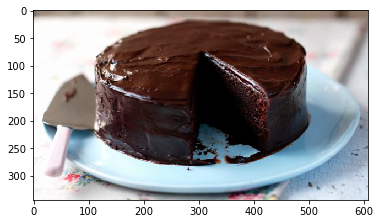

red_velvet_cake_70743_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


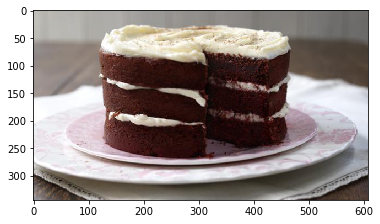

roastlegoflambwithga_90252_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


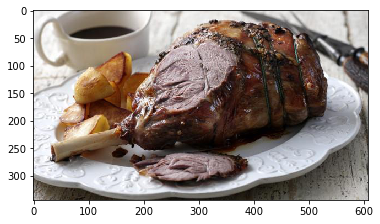

meltedchocolatefonda_77527_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


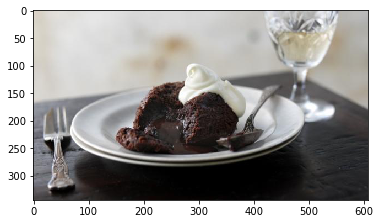

sicilian_lemon_and_38672_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


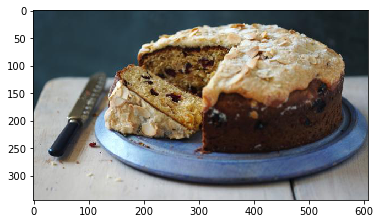

quickapricotappleand_67261_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


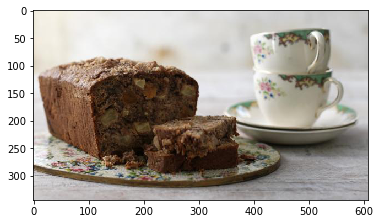

triplechocolatebrown_7685_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


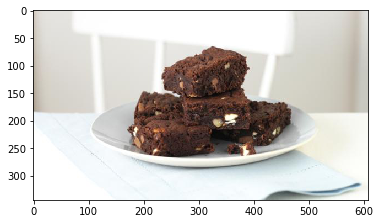

traditional_christmas_38771_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


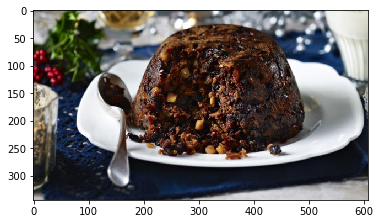

torta_di_serretto_00934_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


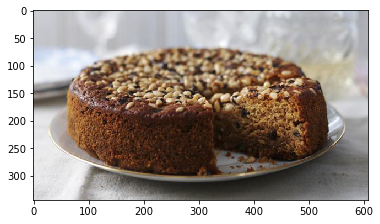

salted_caramel_39300_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


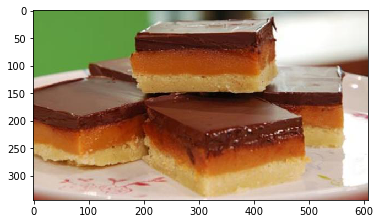

mulledwinetrifle_93108_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


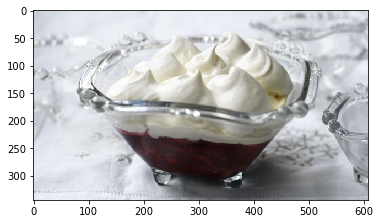

mississippimudpie_93659_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


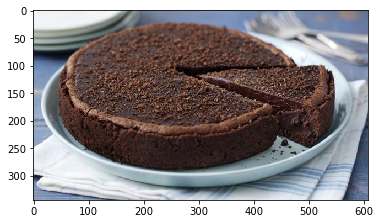

pumpkinpie_70659_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


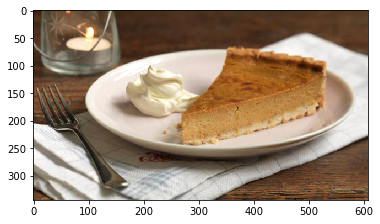

soda_bread_24837_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


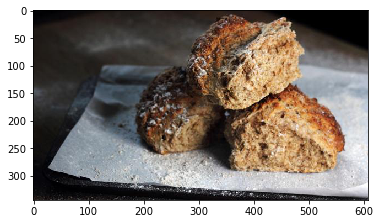

raspberry_and_custard_55703_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


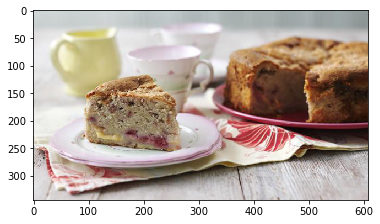

salmonencroute_90282_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


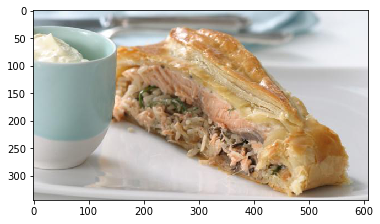

sandwich_bread_loaf_93879_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


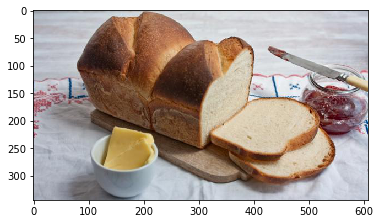

redoniontartetatin_67091_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


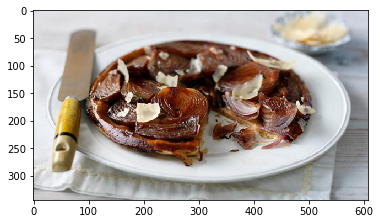

sticky_toffee_pudding_25161_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


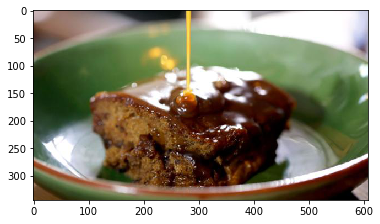

summer_pudding_loaf_92270_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


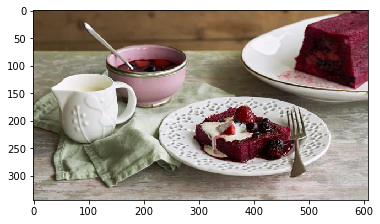

the_skinny_tart_74715_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


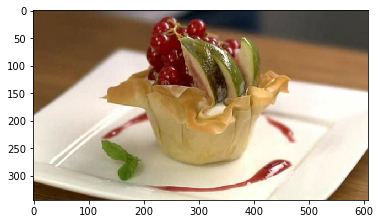

In [31]:
print_similar_imgs(choco_sorted,21,path = bbc_path) 

Mostly desserts (cakes and tarts), although also have some images with darker colours (but not chocolate) mixed in, including roast leg of lamb!
Also doesn't seem to be affected by shape as much as I thought (slice of pumpkin pie, salted caramel squares)
Try another cake or pie with this dataset before training model

### Layered Chocolake Cake

In [32]:
bbc_list.index('black_forest_gateau_43895_16x9.jpg') 

193

In [33]:
bfg_sim = cos_sim_vs_all(bbc_ft.iloc[193].values.reshape(1, -1), bbc_ft) 

In [34]:
bsim_srt = bfg_sim.argsort(axis=None)
bsim_srt

array([  0,   3,   2, ..., 461, 460, 193])

In [35]:
bfg_sorted = np.flipud(bsim_srt) #flipud(up-down) doesn't require 2-D arrays
bfg_sorted[:21] #top 20 most similar, including gateau itself (index 193)

array([193, 460, 461, 559, 307, 563, 585, 322, 482, 494, 455, 478, 287,
       451, 520, 691, 564, 491, 487, 473, 664])

In [36]:
print_similar(bfg_sorted[:21]) 

black_forest_gateau_43895_16x9.jpg
chocolate_brownie_64092_16x9.jpg
chocolate_cake_48307_16x9.jpg
coffee_and_walnut_cake_03763_16x9.jpg
celebration_chocolate_18175_16x9.jpg
coffeeandwalnutcake_83909_16x9.jpg
courgette_and_caraway_84359_16x9.jpg
cheats_chocolate_tart_45173_16x9.jpg
chocolate_whoopies_67418_16x9.jpg
chocolatefruitcake_84675_16x9.jpg
chocolate_and_peppermint_25149_16x9.jpg
chocolate_roulade_79152_16x9.jpg
cardamomandcoffeecak_86632_16x9.jpg
chocolate_and_hazelnut_38207_16x9.jpg
christmascake_77307_16x9.jpg
easter_simnel_cake_82449_16x9.jpg
coffeeandwalnutcake_87248_16x9.jpg
chocolatecolacake_7614_16x9.jpg
chocolatebrownies_90193_16x9.jpg
chocolate_orange_tart_25486_16x9.jpg
definitivechocolatec_72226_16x9.jpg


black_forest_gateau_43895_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


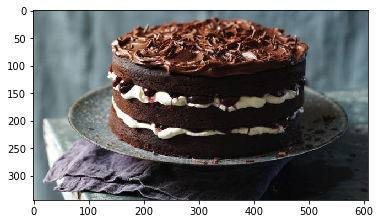

chocolate_brownie_64092_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


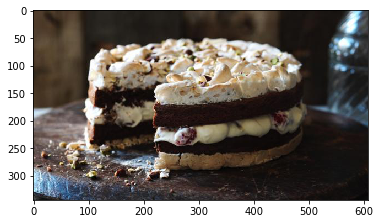

chocolate_cake_48307_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


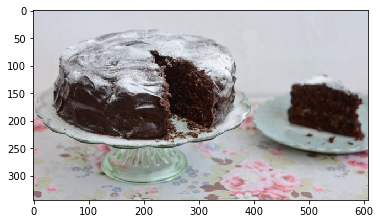

coffee_and_walnut_cake_03763_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


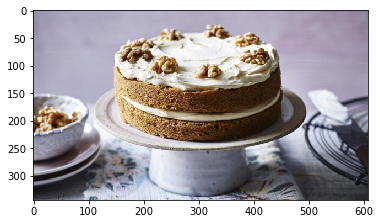

celebration_chocolate_18175_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


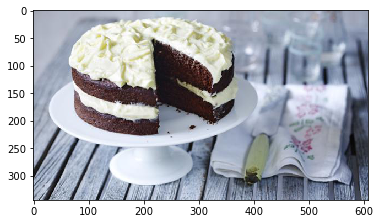

coffeeandwalnutcake_83909_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


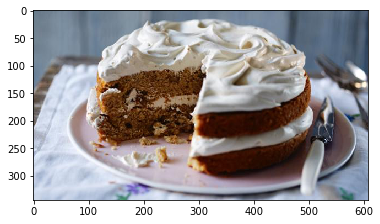

courgette_and_caraway_84359_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


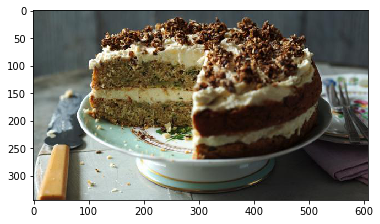

cheats_chocolate_tart_45173_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


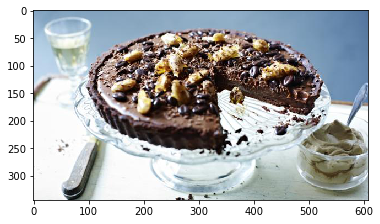

chocolate_whoopies_67418_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


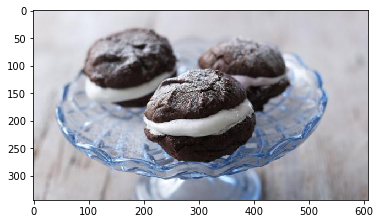

chocolatefruitcake_84675_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


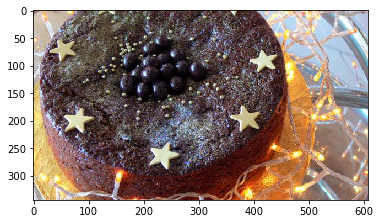

chocolate_and_peppermint_25149_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


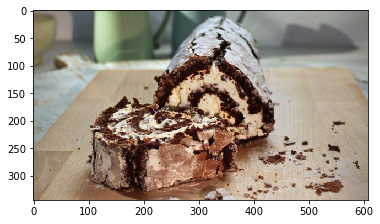

chocolate_roulade_79152_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


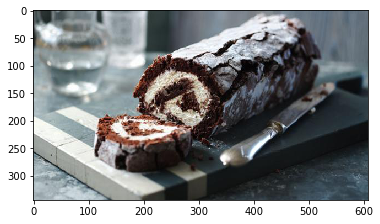

cardamomandcoffeecak_86632_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


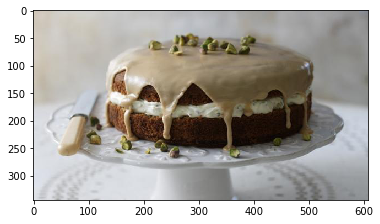

chocolate_and_hazelnut_38207_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


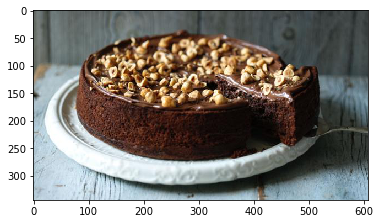

christmascake_77307_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


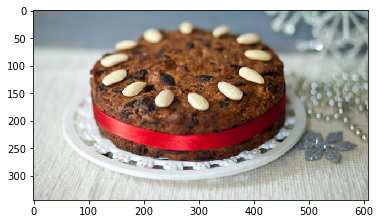

easter_simnel_cake_82449_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


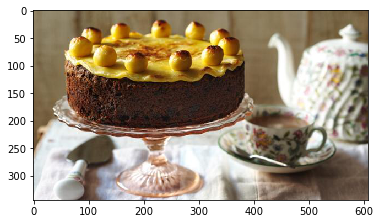

coffeeandwalnutcake_87248_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


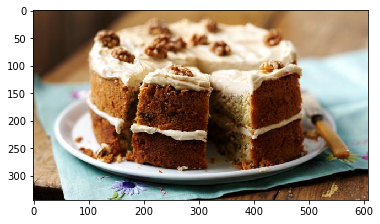

chocolatecolacake_7614_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


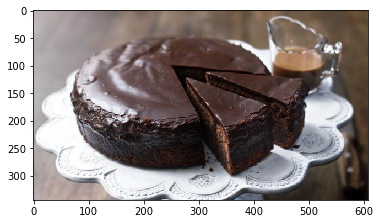

chocolatebrownies_90193_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


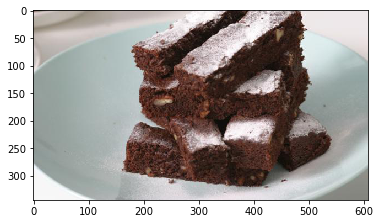

chocolate_orange_tart_25486_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


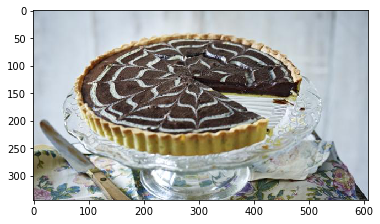

definitivechocolatec_72226_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


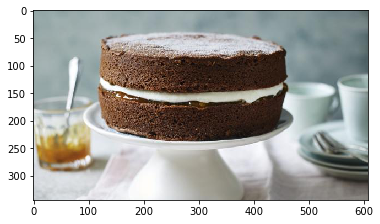

In [37]:
print_similar_imgs(bfg_sorted,21,path = bbc_path)  

In [38]:
#test outside image; test random image
#move on to train CNN final layer? - how many buckets? (CtV or TF-IDF)

### Pie 1

In [39]:
bbc_list.index('chickenandmushroompi_89034_16x9.jpg') 

395

In [40]:
cpie_sim = cos_sim_vs_all(bbc_ft.iloc[395].values.reshape(1, -1), bbc_ft) 

In [41]:
cpiesim_srt = cpie_sim.argsort(axis=None)
cpiesim_srt

array([  2,   1,   3, ..., 577, 436, 395])

In [42]:
cpie_sorted = np.flipud(cpiesim_srt) #flipud(up-down) doesn't require 2-D arrays
cpie_sorted[:21] #top 20 most similar, including itself

array([ 395,  436,  577,  833,  709,  686,  456,  676,  723,  657,  733,
        605,  962,  770,  707,  670, 1159,  649,  355,  985, 1005])

In [43]:
print_similar(cpie_sorted[:21]) 

chickenandmushroompi_89034_16x9.jpg
chilli_beef_cornbread_76029_16x9.jpg
corned_beef_plate_pie_41244_16x9.jpg
gluten-free_apple_and_22345_16x9.jpg
egg_and_bacon_pie_09677_16x9.jpg
earlgreysorbetwithpe_92106_16x9.jpg
chocolate_and_prune_tart_06797_16x9.jpg
double_baked_cheese_94727_16x9.jpg
escalopeofchickenwit_92046_16x9.jpg
dauphinoisepotatoes_90205_16x9.jpg
fabulous_fish_pie_89662_16x9.jpg
creamy_chicken_ham_and_03877_16x9.jpg
iles_flottantes_64016_16x9.jpg
fluffyamericanpancak_74828_16x9.jpg
eccles_cakes_75687_16x9.jpg
diggers_46052_16x9.jpg
maryhenrysproperappl_67463_16x9.jpg
custardtart_83910_16x9.jpg
chicken_and_bacon_21897_16x9.jpg
jam_roly_poly_48764_16x9.jpg
key_lime_and_elderflower_59661_16x9.jpg


chickenandmushroompi_89034_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


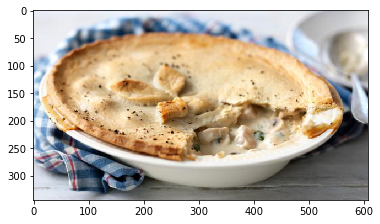

chilli_beef_cornbread_76029_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


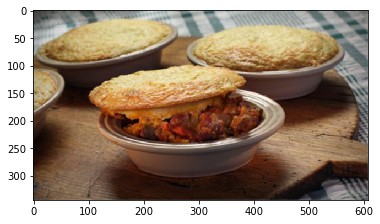

corned_beef_plate_pie_41244_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


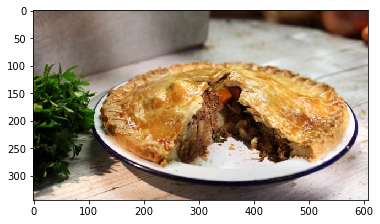

gluten-free_apple_and_22345_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


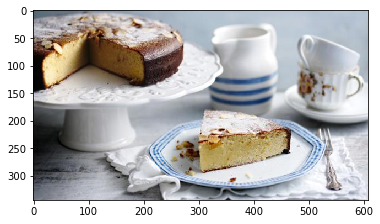

egg_and_bacon_pie_09677_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


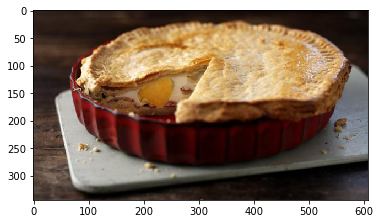

earlgreysorbetwithpe_92106_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


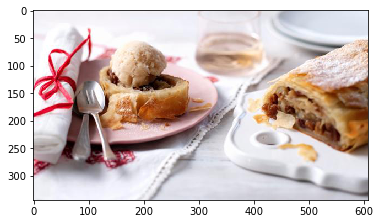

chocolate_and_prune_tart_06797_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


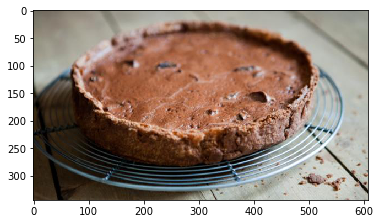

double_baked_cheese_94727_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


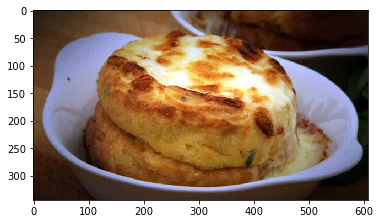

escalopeofchickenwit_92046_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


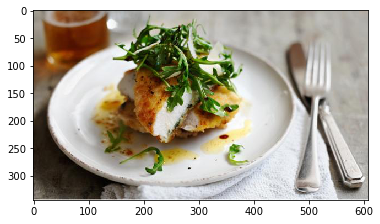

dauphinoisepotatoes_90205_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


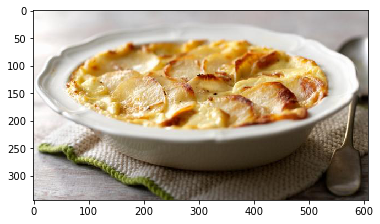

fabulous_fish_pie_89662_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


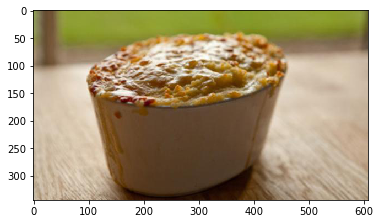

In [44]:
print_similar_imgs(cpie_sorted,11,path = bbc_path)  #top 10 to reduce size

Recommendations also have cakes and tarts thrown in -- would be better if can classify by course of meal first, then look for similar recipes?

### Pie 2 - slice
not many slices in dataset?

In [45]:
bbc_list.index('chicken_and_leek_pie_77394_16x9.jpg') 

360

In [46]:
slicepie_sim = cos_sim_vs_all(bbc_ft.iloc[360].values.reshape(1, -1), bbc_ft) 

In [47]:
slicepie_srt = slicepie_sim.argsort(axis=None)
slicepie_srt

array([  2,   3,   0, ..., 327, 616, 360])

In [48]:
spie_sorted = np.flipud(slicepie_srt) #flipud(up-down) doesn't require 2-D arrays
spie_sorted[:21] #top 20 most similar, including itself 

array([360, 616, 327, 657, 615, 410, 577, 364, 723, 348, 614, 789, 638,
       623, 442, 438, 583, 771, 402, 571, 628])

In [49]:
print_similar(spie_sorted[:21])

chicken_and_leek_pie_77394_16x9.jpg
crispfriedplaice_90189_16x9.jpg
cheese_and_tomato_07140_16x9.jpg
dauphinoisepotatoes_90205_16x9.jpg
crepes_with_orange_97791_16x9.jpg
chickenliverparfaitw_90184_16x9.jpg
corned_beef_plate_pie_41244_16x9.jpg
chicken_braised_in_cider_22812_16x9.jpg
escalopeofchickenwit_92046_16x9.jpg
chestnut_and_mushroom_43005_16x9.jpg
creoleaubergines_92669_16x9.jpg
fried_aubergine_with_69889_16x9.jpg
cumberland_sausage_59571_16x9.jpg
crispyduck_89265_16x9.jpg
chillicrabwitheggnoo_89276_16x9.jpg
chilli_beef_with_jacket_37003_16x9.jpg
countryvegetablesoup_90195_16x9.jpg
focaccia_08389_16x9.jpg
chickenbreastwithros_83819_16x9.jpg
coq_au_vin_87115_16x9.jpg
crumbed_lamb_steak_with_16757_16x9.jpg


giving soups for sliced pie, probably catching more of the sides, plate colour or background?

chicken_and_leek_pie_77394_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


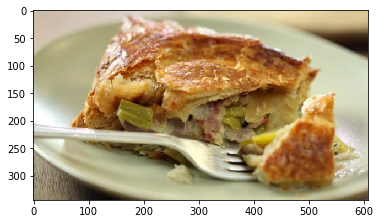

crispfriedplaice_90189_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


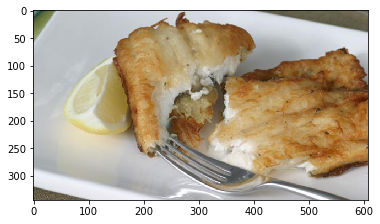

cheese_and_tomato_07140_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


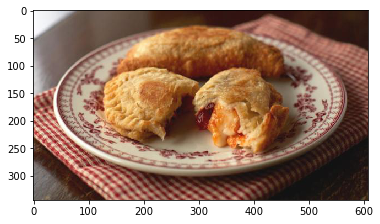

dauphinoisepotatoes_90205_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


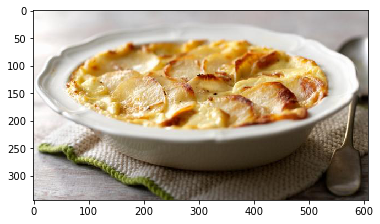

crepes_with_orange_97791_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


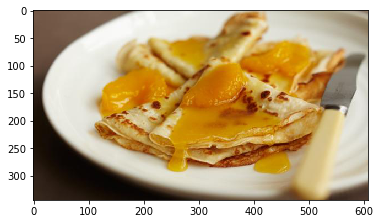

chickenliverparfaitw_90184_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


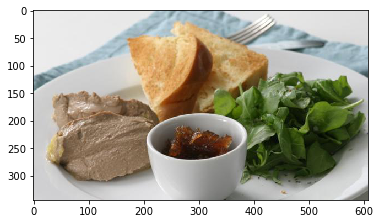

corned_beef_plate_pie_41244_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


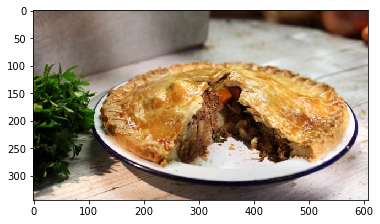

chicken_braised_in_cider_22812_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


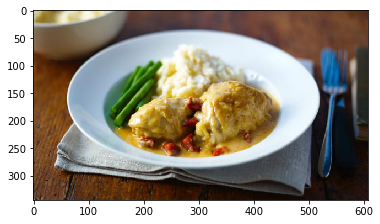

escalopeofchickenwit_92046_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


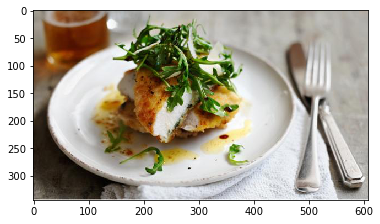

chestnut_and_mushroom_43005_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


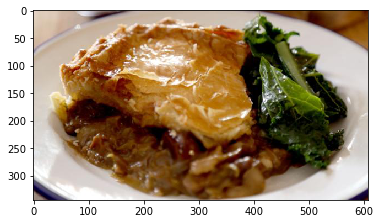

creoleaubergines_92669_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


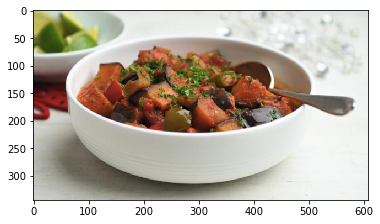

In [50]:
print_similar_imgs(spie_sorted,11,path = bbc_path) #top 10

### Rice dish
more colours, less well-defined shape, more affected by background?

In [51]:
bbc_list.index('curried_chicken_and_rice_47377_16x9.jpg')

646

In [52]:
crice_sim = cos_sim_vs_all(bbc_ft.iloc[646].values.reshape(1, -1), bbc_ft) 

In [53]:
ccr_srt = crice_sim.argsort(axis=None)
ccr_srt

array([   2,    0,    1, ...,  728, 1363,  646])

In [54]:
ccr_sorted = np.flipud(ccr_srt) #flipud(up-down) doesn't require 2-D arrays
ccr_sorted[:21] 

array([ 646, 1363,  728, 1110,  965, 1968, 1239, 1644, 1114, 1316,  865,
       1028, 1197,  989, 1342, 1095, 2050,  645, 1306, 1811,  804])

In [55]:
print_similar(ccr_sorted[:21])

curried_chicken_and_rice_47377_16x9.jpg
pasta_with_almond_basil_68146_16x9.jpg
express_bacon_and_pesto_15099_16x9.jpg
low-fat_chicken_tikka_04689_16x9.jpg
indianscrambledeggs_86454_16x9.jpg
stir_fried_pork_with_85173_16x9.jpg
moroccan_vegetables_with_52330_16x9.jpg
roasted_red_pepper_and_53318_16x9.jpg
lunchbox_chorizo_07622_16x9.jpg
oriental_vegetable_99308_16x9.jpg
greek_salad_16407_16x9.jpg
lamb_fore_shanks_with_73979_16x9.jpg
mexican_tortilla_bake_28158_16x9.jpg
japanesevegetablesti_92442_16x9.jpg
pancettabakedeggswit_93866_16x9.jpg
lighter_lemony_pasta_and_44522_16x9.jpg
thai_chicken_curry_06763_16x9.jpg
curried_cauliflower_with_57222_16x9.jpg
one_pot_chicken_with_05336_16x9.jpg
smallpennepastawithc_11691_16x9.jpg
garlic_mushroom_frittata_50129_16x9.jpg


curried_chicken_and_rice_47377_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


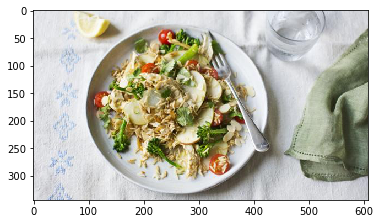

pasta_with_almond_basil_68146_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


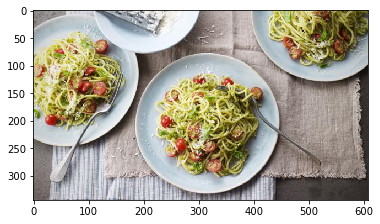

express_bacon_and_pesto_15099_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


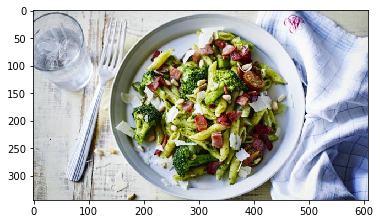

low-fat_chicken_tikka_04689_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


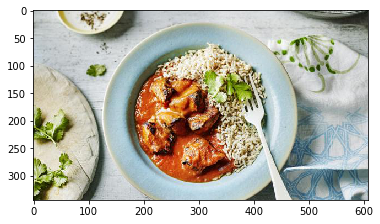

indianscrambledeggs_86454_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


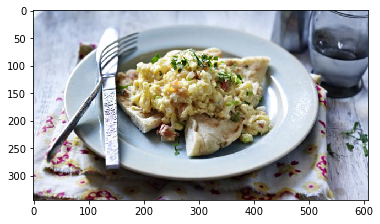

stir_fried_pork_with_85173_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


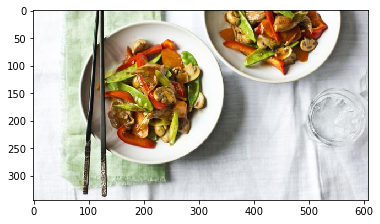

moroccan_vegetables_with_52330_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


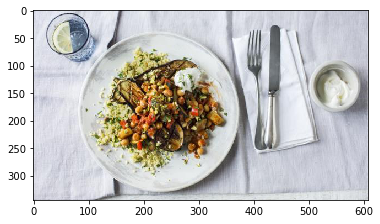

roasted_red_pepper_and_53318_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


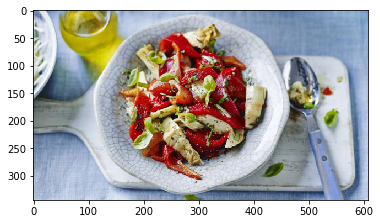

lunchbox_chorizo_07622_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


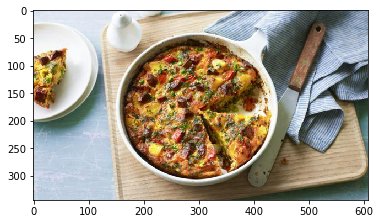

oriental_vegetable_99308_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


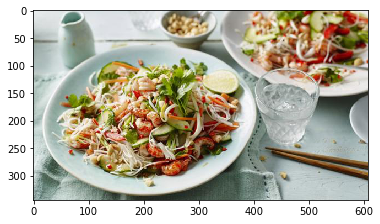

greek_salad_16407_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


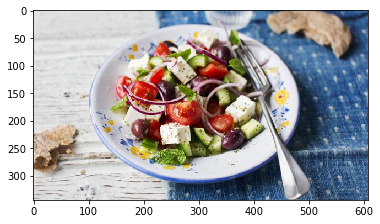

In [56]:
print_similar_imgs(ccr_sorted,11,path = bbc_path) 

Need to decide if this is good enough. Images do seem similar in terms of overall colour theme, composition, colours of the plates, etc. Although top 10 are also mostly lighter, Asian-inspired dishes
(might overfit for this dataset based on image composition?)

---

### Using outside data - allrecipes.com
* whole pie
* cake
* roast?

User-uploaded, more realistic, simpler composition (focuses on the food)
Not labelled with recipe title, can't search for category - problematic

In [ ]:
#read in allrecipes csv file, find features for chosen index 

In [57]:
allre_features5000 = pd.read_csv('/Users/xinrucheng/Documents/Metis_bootcamp/week_9/metis_passion_project/data/processed/allre/allreFeatures_5000.csv')
#taks 13s just to read in csv

In [58]:
allre_features5000.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,4086,4087,4088,4089,4090,4091,4092,4093,4094,4095
0,0,0.000000,0.0,0.33091,0.021203,0.015709,0.0,1.392102,1.50766,0.267907,...,0.0,0.000000,0.0,0.383230,0.0,0.311760,0.000000,1.050733,0.0,0.000000
1,1,0.000000,0.0,0.00000,0.000000,0.000000,0.0,5.261847,0.00000,0.000000,...,0.0,6.647726,0.0,0.301601,0.0,0.000000,5.288575,0.000000,0.0,2.935282
2,2,0.000000,0.0,0.00000,0.000000,0.000000,0.0,2.614837,0.00000,0.000000,...,0.0,0.000000,0.0,2.984888,0.0,0.229374,0.000000,3.004466,0.0,0.000000
3,3,0.000000,0.0,0.00000,0.000000,3.464846,0.0,0.307366,0.00000,1.042838,...,0.0,1.468608,0.0,1.935786,0.0,0.100315,0.000000,0.677642,0.0,0.000000
4,4,0.482392,0.0,0.00000,1.992762,0.000000,0.0,1.059203,0.00000,0.462356,...,0.0,0.000000,0.0,0.000000,0.0,0.041906,0.000000,0.125916,0.0,0.000000


In [60]:
#whole pie
#images not in order, can't assume title=index
pie655 = allre_features5000.iloc[10] #655.jpg  (need to automate this if use allre dataset) -- *didn't include title in feature extraction!

In [61]:
ar_pie655_sim = cos_sim_vs_all(pie655.values.reshape(1, -1), bbc_ft) 

In [62]:
arpie655_srt = ar_pie655_sim.argsort(axis=None)
arpie655_srt

array([2147, 1791, 2072, ...,    9,   40,   13])

In [63]:
arpie655_sorted = np.flipud(arpie655_srt) #flipud(up-down) doesn't require 2-D arrays
arpie655_sorted[:20]  #top 20 most similar in bbc set

array([13, 40,  9, 51, 23, 17, 29, 20, 70, 54, 14, 39, 11, 81,  0, 28, 77,
       83, 71, 66])

In [64]:
arpie655_sorted[-10:] #bottom 10 least similar

array([1425, 1974, 2091, 2047, 1742, 2184, 2132, 2072, 1791, 2147])

In [65]:
print_similar(arpie655_sorted[:20])

almondrolledgoatsche_86765_16x9.jpg
applecharlotte_81084_16x9.jpg
all-purpose_easy_butter_03274_16x9.jpg
arbroath_smokie_cakes_32036_16x9.jpg
angelaschickeninwhit_85878_16x9.jpg
americanbakedcheesec_8358_16x9.jpg
apple_and_rhubarb_37109_16x9.jpg
amershamporkchopswit_80661_16x9.jpg
aubergine_and_tomato_31225_16x9.jpg
arlettes_17164_16x9.jpg
almondymincepies_14566_16x9.jpg
applecake_90046_16x9.jpg
almond_rice_pudding_and_42007_16x9.jpg
bacon_and_egg_pie_06890_16x9.jpg
15_minute_pasta_33407_16x9.jpg
apple_and_cinnamon_loaf_75570_16x9.jpg
baba_ganoush_44415_16x9.jpg
bacon_egg_and_cheese_08419_16x9.jpg
aubergine_chips_with_67293_16x9.jpg
asparagussoup_83241_16x9.jpg


almondrolledgoatsche_86765_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


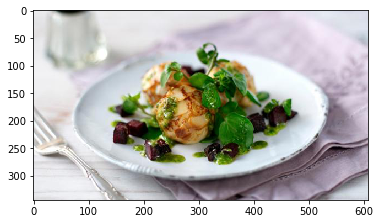

applecharlotte_81084_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


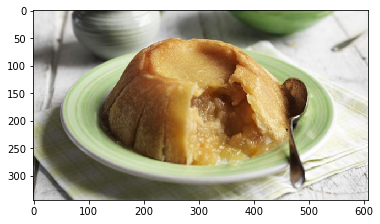

all-purpose_easy_butter_03274_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


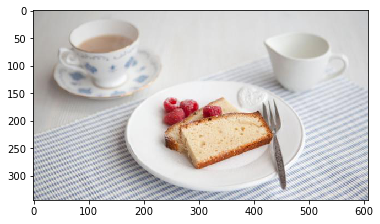

arbroath_smokie_cakes_32036_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


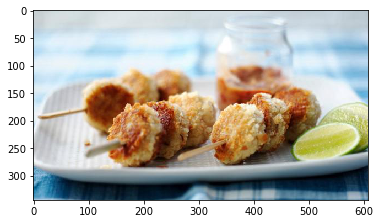

angelaschickeninwhit_85878_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


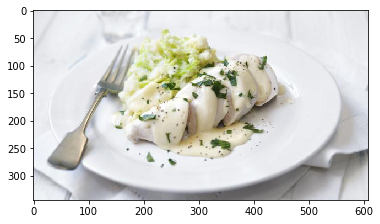

americanbakedcheesec_8358_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


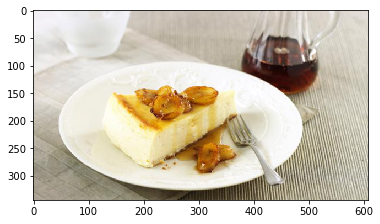

apple_and_rhubarb_37109_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


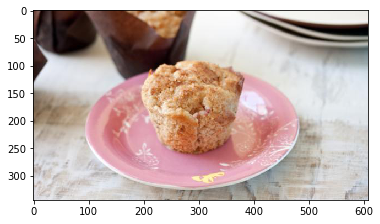

amershamporkchopswit_80661_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


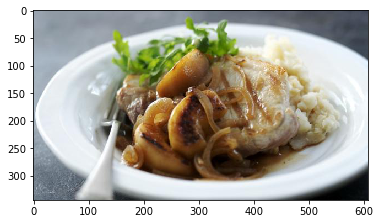

aubergine_and_tomato_31225_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


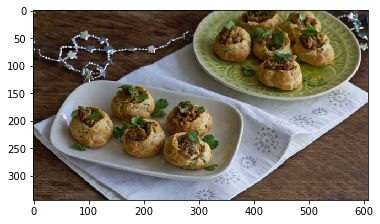

arlettes_17164_16x9.jpg
Populating the interactive namespace from numpy and matplotlib


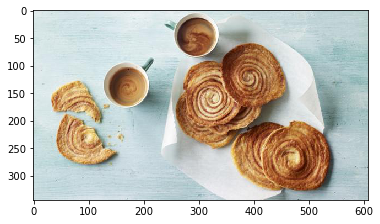

In [66]:
print_similar_imgs(arpie655_sorted,10,path = bbc_path) 

Doesn't work for outside image; need to train classifier

In [67]:
print_similar(arpie655_sorted[-10:])

pilau_rice_81725_16x9.jpg
stollen_27553_16x9.jpg
tomato_and_chilli_jam_20031_16x9.jpg
tennis_cake_09325_16x9.jpg
scary_halloween_cookies_86970_16x9.jpg
watermelonicelollies_89302_16x9.jpg
turkey_stuffing_and_77957_16x9.jpg
thoosha_shinni_91830_16x9.jpg
slow-cooker_sausage_and_19107_16x9.jpg
vegan_prune_and_ginger_17804_16x9.jpg


In [103]:
#print_similar_imgs(arpie655_sorted, -10,path = bbc_path) #function doesn't work for least similar [:num], went back to edit ftn [num:] - inf loop

In [ ]:
# #display images in loop
# def print_similar_imgs(sorted_array, num, path):        
#     for idx in sorted_array[:num]:
#         print(bbc_list[idx])
#         %pylab inline
#         import matplotlib.pyplot as plt
#         import matplotlib.image as mpimg
#         img=mpimg.imread(path + bbc_list[idx])
#         imgplot = plt.imshow(img)
#         plt.show()

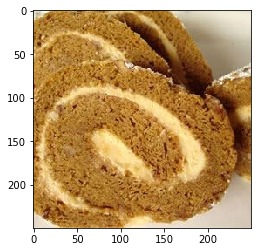

In [107]:
#swiss roll, 3849 - how to find index in allreFeatures csv?
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img=mpimg.imread('/Users/xinrucheng/Documents/Metis_bootcamp/week_9/metis_passion_project/data/raw/testimages/3849.jpg')
imgplot = plt.imshow(img)
plt.show()